# Implementing a retinotopic transform using `grid_sample` from `pyTorch`

The [grid_sample](https://pytorch.org/docs/stable/generated/torch.nn.functional.grid_sample.html) transform is a powerful function which allows to transform any input image into a new topology. It is notably used in [Spatial Transformer Networks](https://arxiv.org/abs/1506.02025) for instance to learn CNN to be invariant to affine transforms. We used it recently in a publication [What You See Is What You Transform: Foveated Spatial Transformers as a Bio-Inspired Attention Mechanism](https://laurentperrinet.github.io/publication/dabane-22/) by Ghassan Dabane *et al*.

The use of `grid_sample` can b etedious and here, we show how to use it to create a log-polar transform of the image and create the following figure:

![Retinotopy](ICLR_fig-logpolar.png)

> A picture (extract from the painting ["The Ambassadors" by Hans Holbein the Younger](https://en.wikipedia.org/wiki/The_Ambassadors_(Holbein))) can be represented on a regular grid represented by vertical (red) and horizontal (blue) lines. Retinotopy transforms this grid, and in particular the area representing the fovea (shaded gray) is over-represented. Applied to the original image of the portrait, the image is strongly distorted and represents more finally the parts under the axis of sight (here the mouth).


<!-- TEASER_END -->

Let's first initialize the notebook :

In [1]:
import os

import numpy as np
import torch
torch.set_printoptions(precision=3, linewidth=140, sci_mode=False)
import torch.nn.functional as F

import matplotlib.pyplot as plt
fig_width = 15
# https://github.com/laurentperrinet/PerrinetBednar15/blob/218b0fa8f114c07ec5f4ba2f6149e461eeb57bf7/notebooks/4%20notebook_figure_results.ipynb#L141
fig_width_points = 1.75 * 379 # % \showthe\columnwidth
inches_per_point = 1.0/72.27               # Convert pt to inches
fig_width = fig_width_points*inches_per_point  # width in inches

# dpi_per_inch =  
# fig_width = 5
dpi = 'figure'
dpi = 100
dpi = 200
opts_savefig = dict(bbox_inches='tight',  dpi=dpi, pad_inches=0, edgecolor=None) # transparent=True

image_size_grid = 257

## definition of the grid

Let's first define a first grid as a set of points defined in absolute coordinates between $-1$ and $1$, and define the corresponding meshgrid:

In [2]:
image_size = 360
image_size_az, image_size_el = image_size, image_size
rs_ = torch.logspace(0, -4, image_size_az, base=2)
ts_ = torch.linspace(-torch.pi, torch.pi, image_size_el+1)[:-1]

grid_xs = torch.outer(rs_, -torch.cos(ts_)) 
grid_ys = torch.outer(rs_, torch.sin(ts_)) 
grid_xs.shape, grid_ys.shape

(torch.Size([360, 360]), torch.Size([360, 360]))

These are then formated in the right format to be used by the function:

In [3]:
center_x, center_y = 0., 0. # defines the fixation point's center in absolute coordinates
logPolar_grid = torch.stack((grid_xs-center_x, grid_ys-center_y), 2)
logPolar_grid = logPolar_grid.unsqueeze(0) # add batch dim
logPolar_grid.shape

torch.Size([1, 360, 360, 2])

In [4]:
logPolar_grid.min()

tensor(-1.)

In [5]:
# F.grid_sample?

## application to a synthetic image

We define a synthetic image to illustrate the transform, it consists of white pixels, red verticals and blue horizontals, regularly spaced:

In [6]:
image_grid_size = 8
image_grid_tens = torch.ones((3, image_size_grid, image_size_grid)).float()
image_grid_tens[0:2, ::image_grid_size, :] = 0
image_grid_tens[1:3, :, ::image_grid_size] = 0.5
fovea_size = 5
image_grid_tens[[0, 2], 
                int(image_size_grid//2+image_grid_size*fovea_size/2.5):int(image_size_grid//2+image_grid_size*fovea_size), 
                int(image_size_grid//2+image_grid_size*fovea_size/2.5):int(image_size_grid//2+image_grid_size*fovea_size), 
                ] = 0
image_grid_tens[[0, 2], 
                int(image_size_grid//2+image_grid_size*fovea_size):int(image_size_grid//2+image_grid_size*fovea_size*2), 
                int(image_size_grid//2-image_grid_size*fovea_size*2):int(image_size_grid//2-image_grid_size*fovea_size), 
                ] = 0
image_grid_tens[:, (image_size_grid//2-image_grid_size*fovea_size):(image_size_grid//2+image_grid_size*fovea_size), (image_size_grid//2-image_grid_size*fovea_size):(image_size_grid//2+image_grid_size*fovea_size)] *= .5
image_grid_tens.shape, image_grid_tens.unsqueeze(0).shape

(torch.Size([3, 257, 257]), torch.Size([1, 3, 257, 257]))

to display it, we need to transform the torch format to a numpy / matplotlib compatible one, which can be first tested on a MWE (minimal working example) using `torch.movedim`:

In [7]:
torch.movedim(torch.randn(1, 2, 3), (0, 1, 2), (1, 2, 0)).shape

torch.Size([3, 1, 2])

this can be done on the image in a few lines:

In [8]:
image_grid = image_grid_tens.squeeze(0)
# swap from C, H, W (torch) to H, W, C (numpy)
image_grid = torch.movedim(image_grid, (1, 2, 0), (0, 1, 2))
image_grid = image_grid.numpy()
image_grid.shape

(257, 257, 3)

so that we can display the synthetic image:

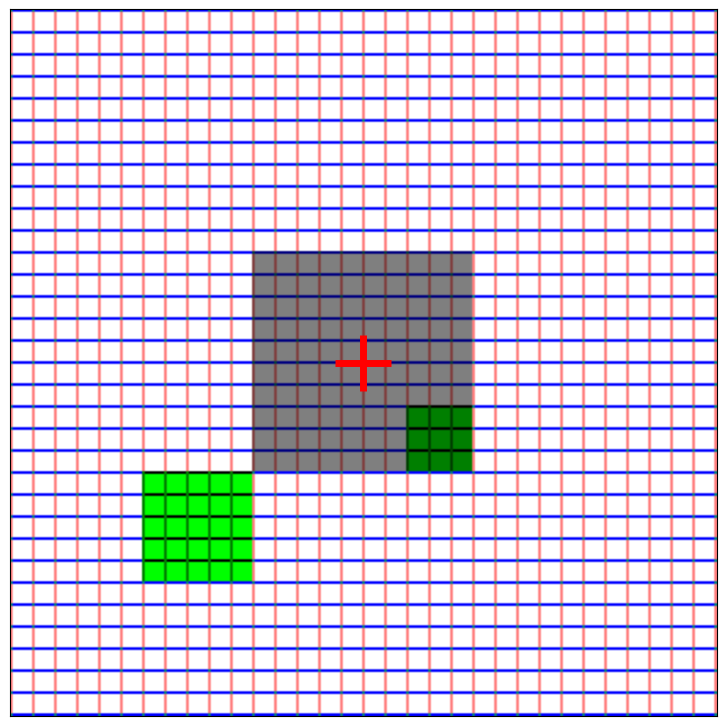

In [9]:
fig, ax = plt.subplots(figsize=(fig_width, fig_width))
ax.imshow(image_grid)
ax.plot(image_size_grid//2, image_size_grid//2, 'r+', markersize=40, markeredgewidth=5)
ax.set_xticks([])
ax.set_yticks([])  
fig.set_facecolor(color='white')

Let's transform the image of the grid:

In [10]:
image_grid_ret_tens = F.grid_sample(image_grid_tens.unsqueeze(0).float(), logPolar_grid, align_corners=False, padding_mode='border')
image_grid_tens.shape, logPolar_grid.shape, image_grid_ret_tens.shape

(torch.Size([3, 257, 257]),
 torch.Size([1, 360, 360, 2]),
 torch.Size([1, 3, 360, 360]))

and transform it back to numpy:

In [11]:
image_grid_ret_tens = image_grid_ret_tens.squeeze(0)
# swap from C, H, W (torch) to H, W, C (numpy)
image_grid_ret_tens = torch.movedim(image_grid_ret_tens, (1, 2, 0), (0, 1, 2))
image_grid_ret = image_grid_ret_tens.numpy()
image_grid_ret /= image_grid_ret.max()
image_grid_ret.shape

(360, 360, 3)

to then display the retinotopic transform of the grid image:

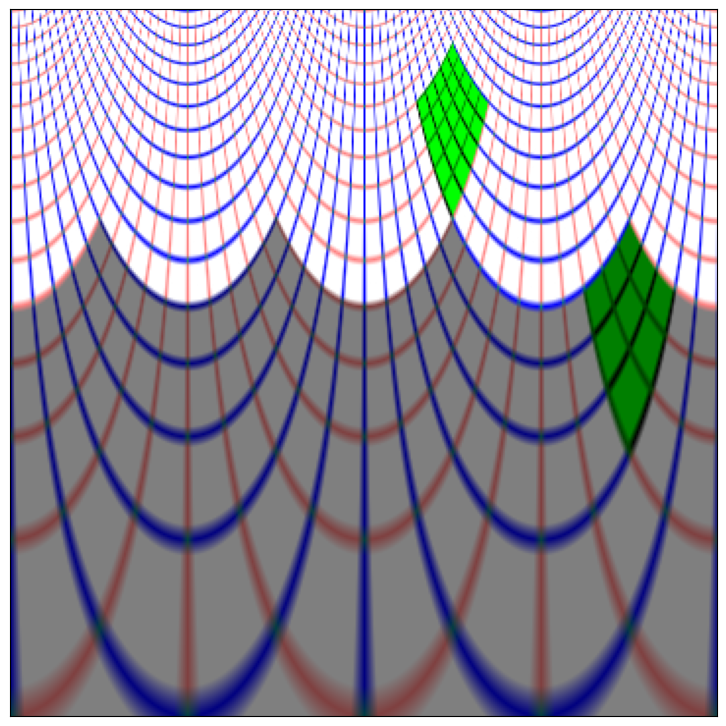

In [12]:
fig, ax = plt.subplots(figsize=(fig_width, fig_width))
ax.imshow(image_grid_ret)
ax.set_xticks([])
ax.set_yticks([])  
fig.set_facecolor(color='white')

## application to a natural image

Let's load an image by extracting a part from the painting ["The Ambassadors" by Hans Holbein the Younger](https://en.wikipedia.org/wiki/The_Ambassadors_(Holbein)) or to any other image:

In [13]:
# image_size = 380
# image_size_az, image_size_el = image_size, image_size
# rs_ = torch.logspace(0, -4, image_size_az, base=2)
# ts_ = torch.linspace(-torch.pi, torch.pi, image_size_el+1)[:-1]

# grid_xs = torch.outer(rs_, -torch.cos(ts_)) 
# grid_ys = torch.outer(rs_, torch.sin(ts_)) 
# grid_xs.shape, grid_ys.shape

In [14]:
image_url = 'https://upload.wikimedia.org/wikipedia/commons/8/88/Hans_Holbein_the_Younger_-_The_Ambassadors_-_Google_Art_Project.jpg'
image_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/8/88/Hans_Holbein_the_Younger_-_The_Ambassadors_-_Google_Art_Project.jpg/608px-Hans_Holbein_the_Younger_-_The_Ambassadors_-_Google_Art_Project.jpg'

im_shift_X, im_shift_Y = 0, 27


In [15]:
import imageio.v2 as imageio

image_url = './imgs/jaguar_5.jpg'

full_image = imageio.imread(image_url) / 255
# full_image = full_image[::2, ::2, :] # downscale to reduce file size
# N_X, N_Y, three = image.shape
print(full_image.shape)

(587, 800, 3)


In [16]:
print (full_image.min(), full_image.max())

0.0 1.0


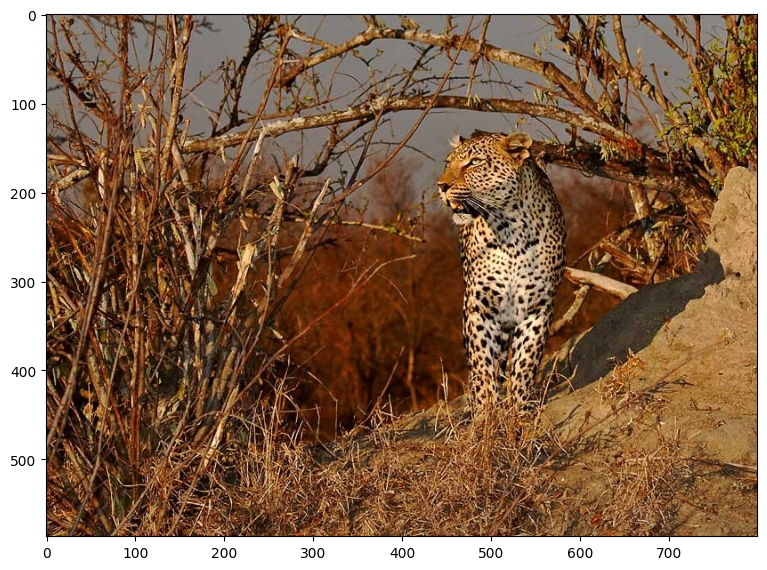

In [17]:
fig, ax = plt.subplots(figsize=(fig_width, fig_width))
ax.imshow(full_image)
# ax.set_xticks([])
# ax.set_yticks([])  
fig.set_facecolor(color='white')

In [18]:

im_shift_X, im_shift_Y = 40, 150

image = full_image[im_shift_X:(im_shift_X+image_size), im_shift_Y:(im_shift_Y+image_size), :]

image.shape

(360, 360, 3)

In [19]:
print (image.min(), image.max())

0.0 1.0


In [20]:
image = (image - image.min()) / (image.max() - image.min())

In [21]:
print (image.min(), image.max())

0.0 1.0


and display it:

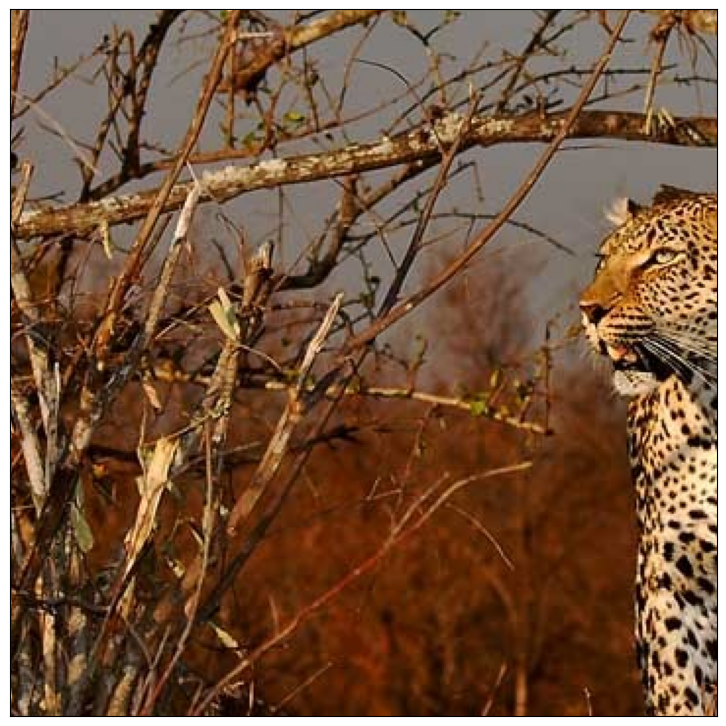

In [22]:
fig, ax = plt.subplots(figsize=(fig_width, fig_width))
ax.imshow(image)
ax.set_xticks([])
ax.set_yticks([])  
fig.set_facecolor(color='white')

to use it in the function, we need to transform the numpy format to a torch compatible one, which can be first tested on a MWE (minimal working example):

In [23]:
torch.movedim(torch.randn(1, 2, 3), (1, 2, 0), (0, 1, 2)).shape

torch.Size([2, 3, 1])

this now looks like:

In [24]:
image_tens = torch.from_numpy(image)
# swap from H, W, C (numpy) to C, H, W (torch)
image_tens = torch.movedim(image_tens, (0, 1, 2), (1, 2, 0))
image.shape, image_tens.shape

((360, 360, 3), torch.Size([3, 360, 360]))

Let's transform the image:

In [25]:
image_ret_tens = F.grid_sample(image_tens.unsqueeze(0).float(), logPolar_grid, align_corners=False, padding_mode='border')
image_ret_tens.shape

torch.Size([1, 3, 360, 360])

and transform it back to numpy:

In [26]:
image_ret_tens = image_ret_tens.squeeze(0)
# swap from C, H, W (torch) to H, W, C (numpy)
image_ret_tens = torch.movedim(image_ret_tens, (1, 2, 0), (0, 1, 2))
image_ret = image_ret_tens.numpy()

and display it:

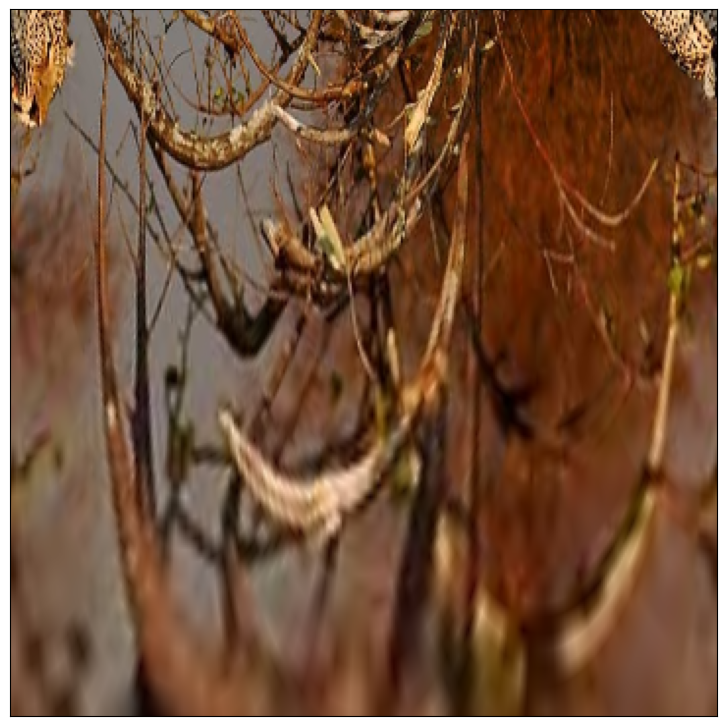

In [27]:
fig, ax = plt.subplots(figsize=(fig_width, fig_width))
ax.imshow(image_ret)
ax.set_xticks([])
ax.set_yticks([])  
fig.set_facecolor(color='white')

Make a plot in linear-polar coordinates:

[]

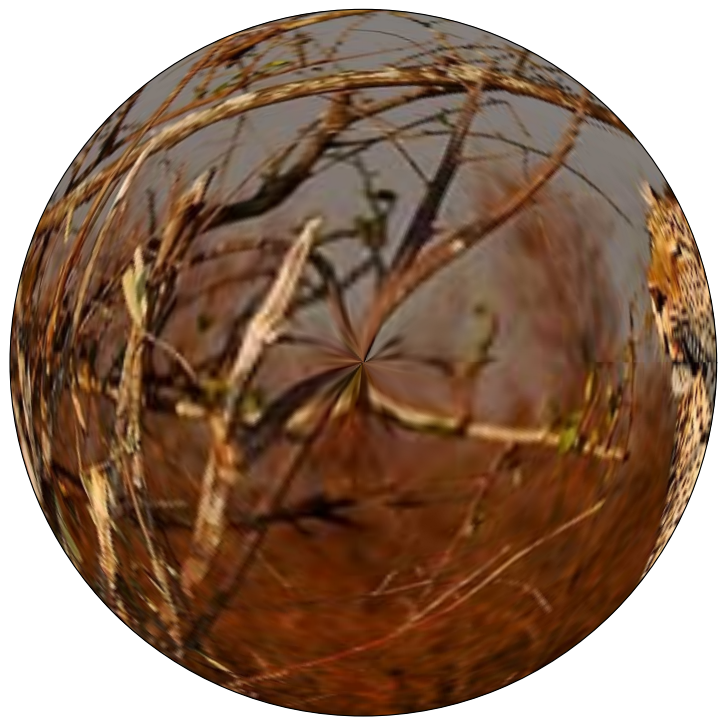

In [28]:
# get coordinates of boxes in the mesh :
phi = np.linspace(0, 2*np.pi, image_ret.shape[1])
r = np.linspace(0, 1, image_ret.shape[0])
Phi, R = np.meshgrid(phi, r)
fig, ax = plt.subplots(1, 1, figsize=(fig_width, fig_width), subplot_kw=dict(polar=True))
# https://matplotlib.org/3.1.1/api/_as_gen/matplotlib.pyplot.pcolormesh.html
# https://matplotlib.org/devdocs/gallery/images_contours_and_fields/pcolormesh_grids.html
m = ax.pcolormesh(Phi, R, np.flipud(image_ret), shading='gouraud', vmin=image_ret.min(), vmax=image_ret.max(), 
                  edgecolors='none', linewidth=0)

from matplotlib.patches import FancyArrowPatch

# arc = FancyArrowPatch((1., 1.2), (1.2, 1.2), connectionstyle="arc3,rad=.5", arrowstyle='<->', mutation_scale=20)
# arc = FancyArrowPatch((1., 1.2), (1.2, 1.2), arrowstyle='<->', mutation_scale=20)
# arc = FancyArrowPatch((1., 1.2), (1.2, 1.2),connectionstyle="arc3,rad=.1",  arrowstyle='<->', mutation_scale=20)
# ax.add_patch(arc)
ax.set_xticks([])
ax.set_yticks([])

Take another snapshot with a different center:

In [29]:
im_shift_X, im_shift_Y = 5, 295
image_shift = full_image[im_shift_X:(im_shift_X+image_size), im_shift_Y:(im_shift_Y+image_size), :]
image_tens = torch.from_numpy(image_shift)
# swap from H, W, C (numpy) to C, H, W (torch)
image_tens = torch.movedim(image_tens, (0, 1, 2), (1, 2, 0))
image_ret_tens = F.grid_sample(image_tens.unsqueeze(0).float(), logPolar_grid, align_corners=False, padding_mode='border')
image_ret_tens = image_ret_tens.squeeze(0)
image_ret_tens = torch.movedim(image_ret_tens, (1, 2, 0), (0, 1, 2))
image_ret_shift = image_ret_tens.numpy()

In [30]:
# fig.add_subplot?

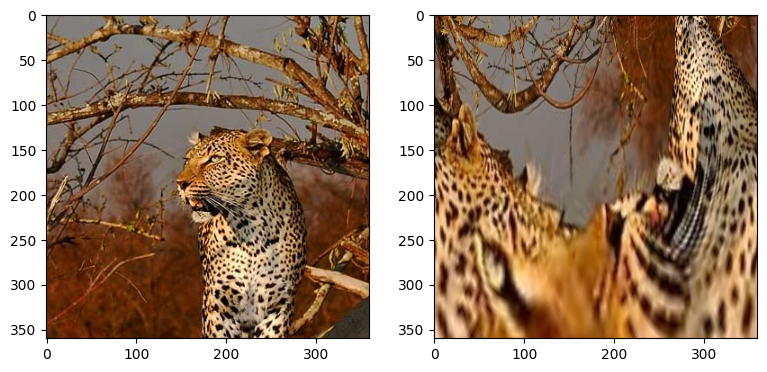

In [31]:
fig, axs = plt.subplots(1, 2, figsize=(fig_width, fig_width))
axs[0].imshow(image_shift)
axs[1].imshow(image_ret_shift)
fig.set_facecolor(color='white')

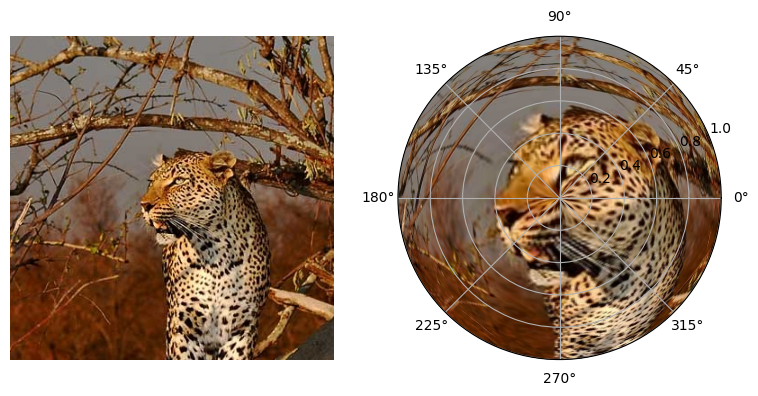

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(fig_width, fig_width/2))
axs[0].imshow(image_shift)
ax = fig.add_subplot(122, polar=True)
# axs[1].imshow(image_ret_shift)
m = ax.pcolormesh(Phi, R, np.flipud(image_ret_shift), shading='gouraud', vmin=image_ret.min(), vmax=image_ret.max(), 
                  edgecolors='none', linewidth=0)
# ax.set_thetamin(0)
# ax.set_thetamax(360)

for ax in axs :
    ax.set_xticks([])
    ax.set_yticks([])
    # ax.get_xaxis().set_ticks([])
    # ax.get_yaxis().set_ticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    # ax.spines['top'].set_visible(False)
    # ax.spines['right'].set_visible(False)
    # ax.spines['bottom'].set_visible(False)
    # ax.spines['left'].set_visible(False)
# fig.set_facecolor(color='white')

[]

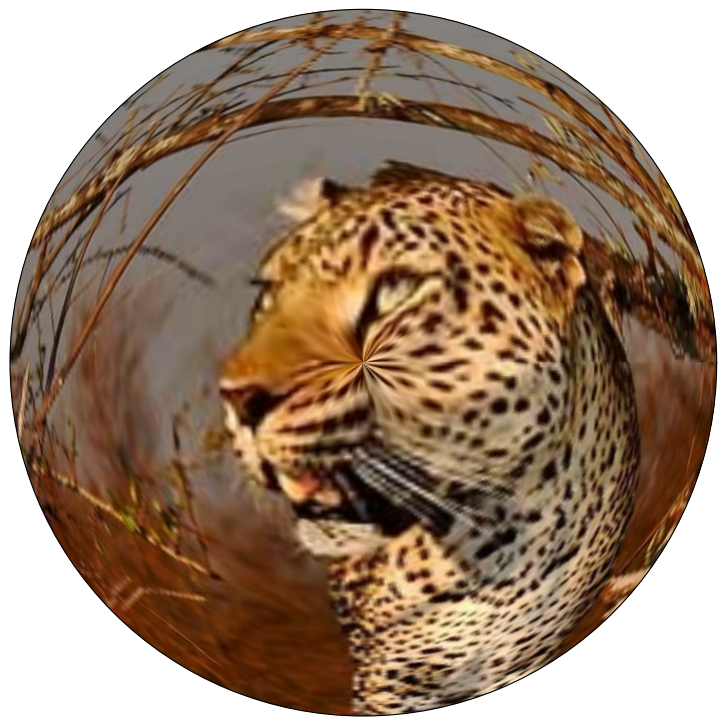

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(fig_width, fig_width), subplot_kw=dict(polar=True))
m = ax.pcolormesh(Phi, R, np.flipud(image_ret_shift), shading='gouraud', vmin=image_ret.min(), vmax=image_ret.max(), 
                  edgecolors='none', linewidth=0)

ax.set_xticks([])
ax.set_yticks([])

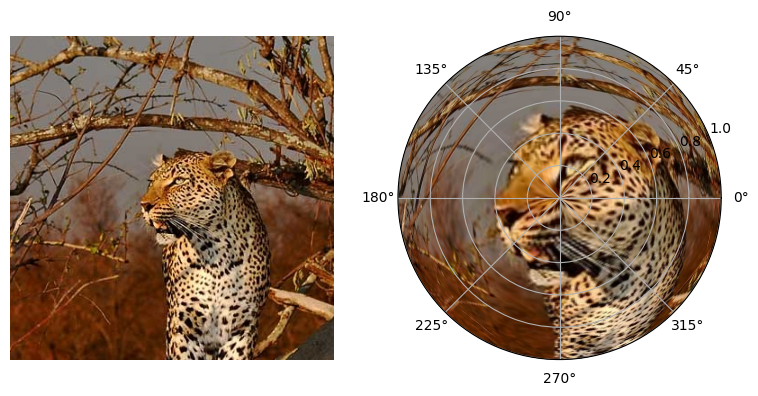

In [34]:
fig, axs = plt.subplots(1, 2, figsize=(fig_width, fig_width/2))
axs[0].imshow(image_shift)
ax = fig.add_subplot(122, polar=True)
m = ax.pcolormesh(Phi, R, np.flipud(image_ret_shift), shading='gouraud', vmin=image_ret.min(), vmax=image_ret.max(), 
                  edgecolors='none', linewidth=0)
for ax in axs :
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
fig.set_facecolor(color='white')

## summary

### version with maps

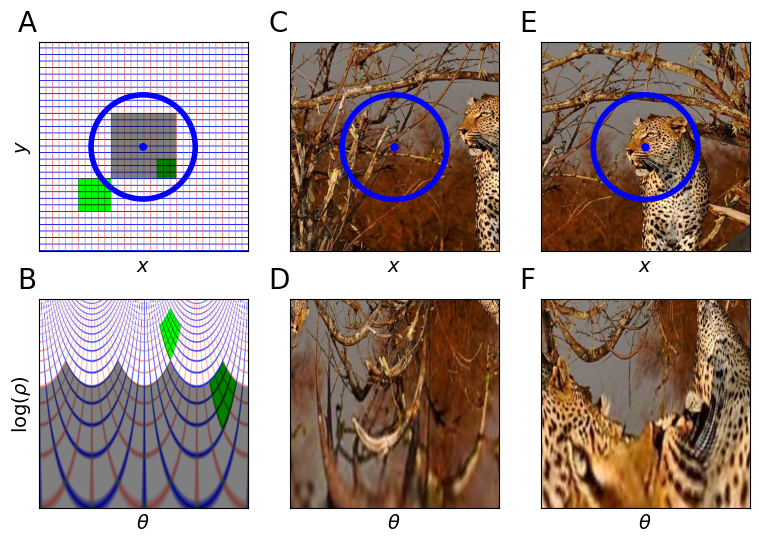

In [35]:
fig, axs = plt.subplots(2, 3, figsize=(fig_width, fig_width*2/3))
from matplotlib.patches import Circle

ax = axs[0][0]
ax.imshow(image_grid)
# ax.plot(image_size//2, image_size//2, 'r+', markersize=20, markeredgewidth=2)
color = 'b'
circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.text(-.1, 1.05, 'A', fontsize=20, color='black', transform=ax.transAxes)
# ax.plot(image_size_grid//2, image_size_grid//2, 'r+', markersize=20, markeredgewidth=2)
ax.set_xlabel(r'$x$', fontsize=14)
ax.set_ylabel(r'$y$', fontsize=14)
ax = axs[1][0]
ax.imshow(image_grid_ret)
ax.text(-.1, 1.05, 'B', fontsize=20, color='black', transform=ax.transAxes)
ax.set_xlabel(r'$\theta$', fontsize=14)
ax.set_ylabel(r'log($\rho$)', fontsize=14)

ax = axs[0][1]
ax.imshow(image)
circ = Circle((image_size//2, image_size//2), radius=(image_size//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size//2, image_size//2), radius=(image_size//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.set_xlabel(r'$x$', fontsize=14)
ax.text(-.1, 1.05, 'C', fontsize=20, color='black', transform=ax.transAxes)
ax = axs[1][1]
ax.imshow(image_ret)
ax.set_xlabel(r'$\theta$', fontsize=14)
ax.text(-.1, 1.05, 'D', fontsize=20, color='black', transform=ax.transAxes)

ax = axs[0][2]
ax.imshow(image_shift)
circ = Circle((image_size//2, image_size//2), radius=(image_size//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size//2, image_size//2), radius=(image_size//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.set_xlabel(r'$x$', fontsize=14)
ax.text(-.1, 1.05, 'E', fontsize=20, color='black', transform=ax.transAxes)
ax = axs[1][2]
ax.imshow(image_ret_shift)
ax.set_xlabel(r'$\theta$', fontsize=14)
ax.text(-.1, 1.05, 'F', fontsize=20, color='black', transform=ax.transAxes)

for ax in axs.ravel():
    ax.set_xticks([])
    ax.set_yticks([])  
fig.set_facecolor(color='white')


In [36]:
# if do_save: to_save(fig, name='fig-logpolar')

### version with reconstructions


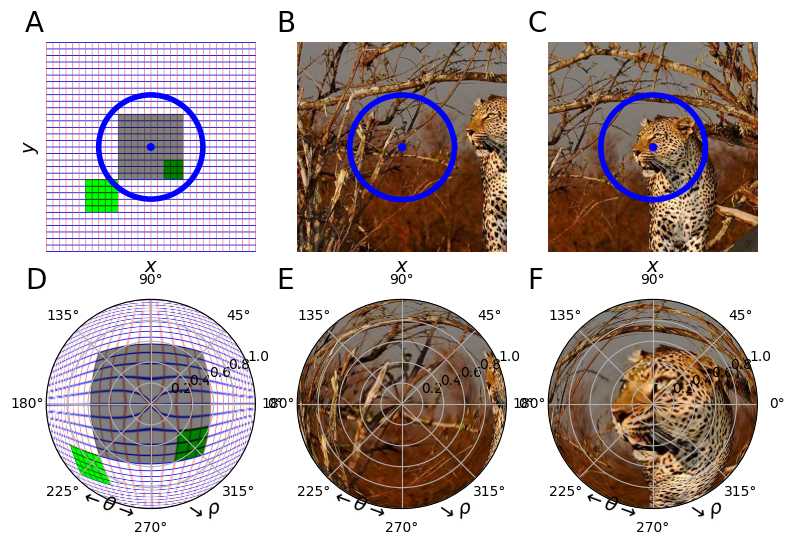

In [37]:
fig, axs = plt.subplots(2, 3, figsize=(fig_width, fig_width*2/3))
from matplotlib.patches import Circle

ax = axs[0][0]
ax.imshow(image_grid)
# ax.plot(image_size//2, image_size//2, 'r+', markersize=20, markeredgewidth=2)
color = 'b'
circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.text(-.1, 1.05, 'A', fontsize=20, color='black', transform=ax.transAxes)
# ax.plot(image_size_grid//2, image_size_grid//2, 'r+', markersize=20, markeredgewidth=2)
ax.set_xlabel(r'$x$', fontsize=14)
ax.set_ylabel(r'$y$', fontsize=14)
# ax = axs[1][0]
ax = fig.add_subplot(2, 3, 4, polar=True)
m = ax.pcolormesh(Phi, R, np.flipud(image_grid_ret), shading='gouraud', vmin=image_grid_ret.min(), vmax=image_grid_ret.max(), 
                  edgecolors='none', linewidth=0)

# ax.imshow(image_grid_ret)
ax.text(-.1, 1.05, 'D', fontsize=20, color='black', transform=ax.transAxes)
ax.text(.15, -.05, r'$\leftarrow\theta\rightarrow$', fontsize=14, color='black', transform=ax.transAxes, rotation=-20)
ax.text(.65, -.05, r'$\searrow \rho$', fontsize=14, color='black', transform=ax.transAxes, rotation=10)

ax = axs[0][1]
ax.imshow(image)
circ = Circle((image_size//2, image_size//2), radius=(image_size//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size//2, image_size//2), radius=(image_size//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.set_xlabel(r'$x$', fontsize=14)
ax.text(-.1, 1.05, 'B', fontsize=20, color='black', transform=ax.transAxes)
# ax = axs[1][1]
ax = fig.add_subplot(2, 3, 5, polar=True)
m = ax.pcolormesh(Phi, R, np.flipud(image_ret), shading='gouraud', vmin=image_ret.min(), vmax=image_ret.max(), 
                  edgecolors='none', linewidth=0)
# ax.imshow(image_ret)
ax.text(.15, -.05, r'$\leftarrow\theta\rightarrow$', fontsize=14, color='black', transform=ax.transAxes, rotation=-20)
ax.text(.65, -.05, r'$\searrow \rho$', fontsize=14, color='black', transform=ax.transAxes, rotation=10)
ax.text(-.1, 1.05, 'E', fontsize=20, color='black', transform=ax.transAxes)

ax = axs[0][2]
ax.imshow(image_shift)
circ = Circle((image_size//2, image_size//2), radius=(image_size//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size//2, image_size//2), radius=(image_size//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.set_xlabel(r'$x$', fontsize=14)
ax.text(-.1, 1.05, 'C', fontsize=20, color='black', transform=ax.transAxes)
# ax = axs[1][2]
ax = fig.add_subplot(2, 3, 6, polar=True)
m = ax.pcolormesh(Phi, R, np.flipud(image_ret_shift), shading='gouraud', vmin=image_ret_shift.min(), vmax=image_ret_shift.max(), 
                  edgecolors='none', linewidth=0)
# ax.imshow(image_ret_shift)
# ax.set_xlabel(r'$\theta$', fontsize=14)
# angle_arc = 3
# arc = FancyArrowPatch((angle_arc, 1.1), (angle_arc+.2, 1.1),connectionstyle="arc3,rad=.1",  arrowstyle='<->', mutation_scale=20)
# ax.add_patch(arc)

ax.text(.15, -.05, r'$\leftarrow\theta\rightarrow$', fontsize=14, color='black', transform=ax.transAxes, rotation=-20)
ax.text(.65, -.05, r'$\searrow \rho$', fontsize=14, color='black', transform=ax.transAxes, rotation=10)
ax.text(-.1, 1.05, 'F', fontsize=20, color='black', transform=ax.transAxes)

for ax in axs.ravel():
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

fig.set_facecolor(color='white')


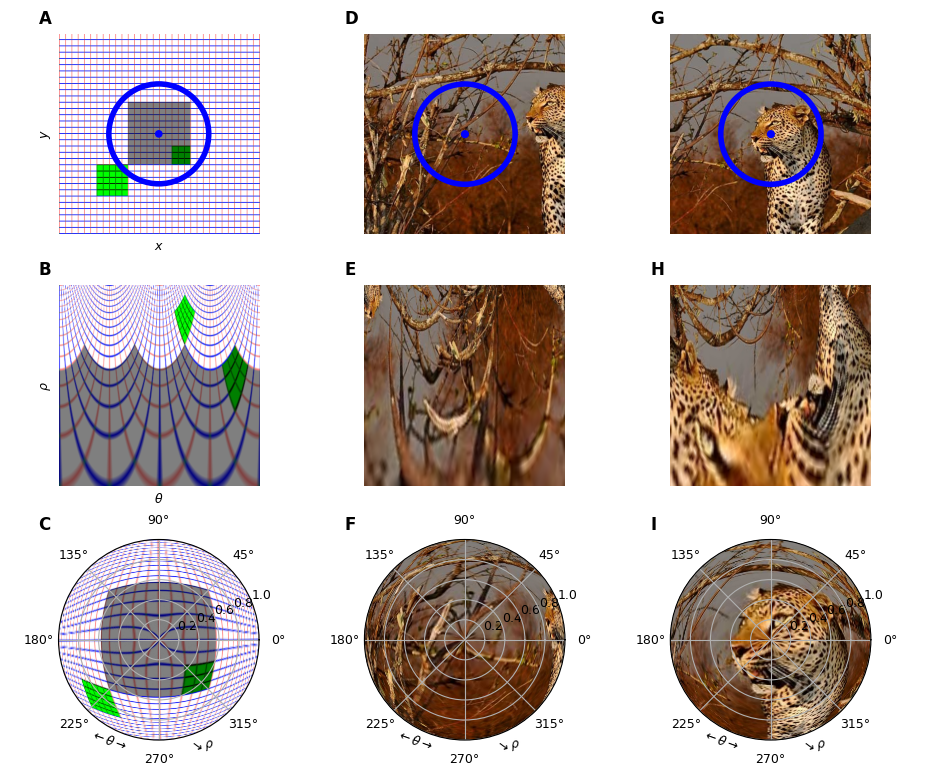

In [38]:
fig, axs = plt.subplots(3, 3, figsize=(fig_width, fig_width*5/6), layout="constrained")
from matplotlib.patches import Circle

fontsize_letters = 12
fontsize_labels = 9

ax = axs[0][0]
ax.imshow(image_grid)
color = 'b'
circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.text(-.1, 1.05, 'A', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)
ax.set_xlabel(r'$x$', fontsize=fontsize_labels)
ax.set_ylabel(r'$y$', fontsize=fontsize_labels)
# ax = axs[1][0]

ax = axs[1][0]
ax.imshow(image_grid_ret)
ax.text(-.1, 1.05, 'B', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)
ax.set_xlabel(r'$\theta$', fontsize=fontsize_labels)
ax.set_ylabel(r'$\rho$', fontsize=fontsize_labels)

ax = fig.add_subplot(3, 3, 7, polar=True)
m = ax.pcolormesh(Phi, R, np.flipud(image_grid_ret), shading='gouraud', vmin=image_grid_ret.min(), vmax=image_grid_ret.max(), 
                  edgecolors='none', linewidth=0)

# ax.imshow(image_grid_ret)
ax.text(-.1, 1.05, 'C', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)
ax.text(.15, -.05, r'$\leftarrow\theta\rightarrow$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=-20)
ax.text(.65, -.05, r'$\searrow \rho$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=10)
plt.tick_params(axis='both', labelsize=fontsize_labels)



ax = axs[0][1]
ax.imshow(image)
circ = Circle((image_size//2, image_size//2), radius=(image_size//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size//2, image_size//2), radius=(image_size//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.text(-.1, 1.05, 'D', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)
# ax = axs[1][1]

ax = axs[1][1]
ax.imshow(image_ret)
ax.text(-.1, 1.05, 'E', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)

ax = fig.add_subplot(3, 3, 8, polar=True)
m = ax.pcolormesh(Phi, R, np.flipud(image_ret), shading='gouraud', vmin=image_ret.min(), vmax=image_ret.max(), 
                  edgecolors='none', linewidth=0)
# ax.imshow(image_ret)
ax.text(.15, -.05, r'$\leftarrow\theta\rightarrow$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=-20)
ax.text(.65, -.05, r'$\searrow \rho$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=10)
ax.text(-.1, 1.05, 'F', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)
plt.tick_params(axis='both', labelsize=fontsize_labels)




ax = axs[0][2]
ax.imshow(image_shift)
circ = Circle((image_size//2, image_size//2), radius=(image_size//60), edgecolor=color, facecolor=color)
ax.add_patch(circ)
circ = Circle((image_size//2, image_size//2), radius=(image_size//4), lw=4, edgecolor=color, facecolor='none')
ax.add_patch(circ)
ax.text(-.1, 1.05, 'G', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)
# ax = axs[1][2]

ax = axs[1][2]
ax.imshow(image_ret_shift)
ax.text(-.1, 1.05, 'H', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)

ax = fig.add_subplot(3, 3, 9, polar=True)
m = ax.pcolormesh(Phi, R, np.flipud(image_ret_shift), shading='gouraud', vmin=image_ret_shift.min(), vmax=image_ret_shift.max(), 
                  edgecolors='none', linewidth=0)

ax.text(.15, -.05, r'$\leftarrow\theta\rightarrow$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=-20)
ax.text(.65, -.05, r'$\searrow \rho$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=10)
ax.text(-.1, 1.05, 'I', fontsize=fontsize_letters, color='black', weight='bold', transform=ax.transAxes)
plt.tick_params(axis='both', labelsize=fontsize_labels)

for ax in axs.ravel():
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

fig.set_facecolor(color='white')


In [39]:
for ext in ['pdf', 'png', 'jpg']:#, 'svg']: ,dpi=300
    fig.savefig(f'figs/fig-logpolar.{ext}',  **opts_savefig)
# if do_save: to_save(fig, name='fig-logpolar', exts=['pdf', 'png', 'jpg'])


## movies illustrating the properties of the log-polar transform

In [40]:
from retinotopy import make_mp4

Running on GPU :  NVIDIA RTX A2000 12GB #GPU= 1


In [41]:
from torchvision.transforms import RandomAffine

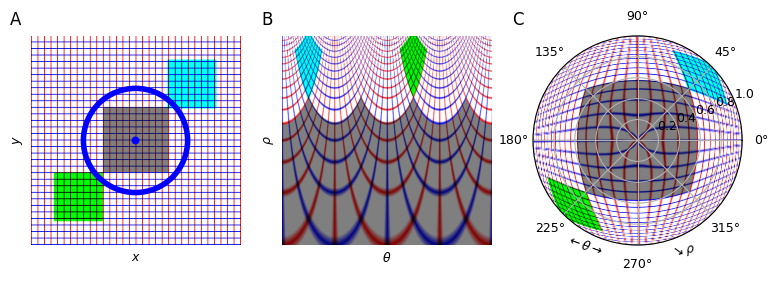

In [42]:
def create_fig(theta=np.pi/4, scale=1):

    image_grid_size = 8
    image_grid_tens = torch.ones((3, image_size_grid, image_size_grid)).float()
    fovea_size = 5
    image_square_tens = torch.ones((3, image_size_grid, image_size_grid)).float()
    image_square_tens[[1, 0],  # green square
                    int(image_size_grid//2+image_grid_size*fovea_size/2.5):int(image_size_grid//2+image_grid_size*fovea_size), 
                    int(image_size_grid//2+image_grid_size*fovea_size/2.5):int(image_size_grid//2+image_grid_size*fovea_size), 
                    ] = 0
    
    # todo : scale and rotate image_square_tens
    transform = RandomAffine(degrees=(theta*180/np.pi, theta*180/np.pi+0.01), scale=(scale, scale))
    image_square_tens = transform(image_square_tens)
    
    image_grid_tens[[0, 2], :, :] = image_square_tens[[0, 2], :, :]

    image_grid_tens[[0, 2], 
                    int(image_size_grid//2+image_grid_size*fovea_size):int(image_size_grid//2+image_grid_size*fovea_size*2.5), 
                    int(image_size_grid//2-image_grid_size*fovea_size*2.5):int(image_size_grid//2-image_grid_size*fovea_size), 
                    ] = 0
    
    image_grid_tens[0:2, ::image_grid_size, :] = 0 # grid H
    image_grid_tens[1:3, :, ::image_grid_size] = 0 # grid V
    image_grid_tens[:, (image_size_grid//2-image_grid_size*fovea_size):(image_size_grid//2+image_grid_size*fovea_size), (image_size_grid//2-image_grid_size*fovea_size):(image_size_grid//2+image_grid_size*fovea_size)] *= .5 # fovea

    image_grid = image_grid_tens.squeeze(0)
    # swap from C, H, W (torch) to H, W, C (numpy)
    image_grid = torch.movedim(image_grid, (1, 2, 0), (0, 1, 2))
    image_grid = image_grid.numpy()
    
    image_grid_ret_tens = F.grid_sample(image_grid_tens.unsqueeze(0).float(), logPolar_grid, align_corners=False, padding_mode='border')
    image_grid_ret_tens = image_grid_ret_tens.squeeze(0)
    # swap from C, H, W (torch) to H, W, C (numpy)
    image_grid_ret_tens = torch.movedim(image_grid_ret_tens, (1, 2, 0), (0, 1, 2))
    image_grid_ret = image_grid_ret_tens.numpy()
    image_grid_ret /= image_grid_ret.max()
    

    fig, axs = plt.subplots(1, 3, figsize=(fig_width, fig_width/3))
    from matplotlib.patches import Circle

    ax = axs[0]
    ax.imshow(image_grid)
    # ax.plot(image_size//2, image_size//2, 'r+', markersize=20, markeredgewidth=2)
    color = 'b'
    circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//60), edgecolor=color, facecolor=color)
    ax.add_patch(circ)
    circ = Circle((image_size_grid//2, image_size_grid//2), radius=(image_size_grid//4), lw=4, edgecolor=color, facecolor='none')
    ax.add_patch(circ)
    ax.text(-.1, 1.05, 'A', fontsize=fontsize_letters, color='black', transform=ax.transAxes)
    # ax.plot(image_size_grid//2, image_size_grid//2, 'r+', markersize=20, markeredgewidth=2)
    ax.set_xlabel(r'$x$', fontsize=fontsize_labels)
    ax.set_ylabel(r'$y$', fontsize=fontsize_labels)
    
    ax = axs[1]
    ax.imshow(image_grid_ret)
    ax.text(-.1, 1.05, 'B', fontsize=fontsize_letters, color='black', transform=ax.transAxes)
    ax.set_xlabel(r'$\theta$', fontsize=fontsize_labels)
    ax.set_ylabel(r'$\rho$', fontsize=fontsize_labels)

    ax = fig.add_subplot(1, 3, 3, polar=True)
    m = ax.pcolormesh(Phi, R, np.flipud(image_grid_ret), shading='gouraud', vmin=image_ret.min(), vmax=image_ret.max(), 
                    edgecolors='none', linewidth=0)
    # ax.imshow(image_ret)
    ax.text(.15, -.05, r'$\leftarrow\theta\rightarrow$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=-20)
    ax.text(.65, -.05, r'$\searrow \rho$', fontsize=fontsize_labels, color='black', transform=ax.transAxes, rotation=10)
    ax.text(-.1, 1.05, 'C', fontsize=fontsize_letters, color='black', transform=ax.transAxes)
    # for tick in ax.xaxis.get_major_ticks():
    #     tick.label.set_fontsize(fontsize_labels) 
    plt.tick_params(axis='both', labelsize=fontsize_labels)

    for ax in axs.ravel():
        ax.set_xticks([])
        # ax.set_xticklabels([])
        ax.set_yticks([])  
        for spine in ax.spines.values():
            spine.set_visible(False)
    fig.set_facecolor(color='white')
    return fig

fig = create_fig(theta=-np.pi/2, scale=2.5)

In [43]:
from tqdm import tqdm, trange

n_frame = 150
fnames = []
for i_frame in trange(n_frame):
    fname = f'/tmp/frame_{i_frame:04d}.png'
    fig = create_fig(theta=np.pi/2 + i_frame*2*np.pi/n_frame, scale=2.5+np.sin(i_frame*2*np.pi/n_frame))
    fig.savefig(fname)
    fnames.append(fname)
    plt.close(fig)

mp4name = make_mp4('figs/grid.mp4', fnames, fps=15)

  0%|                                                                                                                                                                       | 0/150 [00:00<?, ?it/s]

  1%|█                                                                                                                                                              | 1/150 [00:00<00:43,  3.39it/s]

  1%|██                                                                                                                                                             | 2/150 [00:00<00:43,  3.41it/s]

  2%|███▏                                                                                                                                                           | 3/150 [00:00<00:42,  3.42it/s]

  3%|████▏                                                                                                                                                          | 4/150 [00:01<00:42,  3.44it/s]

  3%|█████▎                                                                                                                                                         | 5/150 [00:01<00:42,  3.44it/s]

  4%|██████▎                                                                                                                                                        | 6/150 [00:01<00:42,  3.38it/s]

  5%|███████▍                                                                                                                                                       | 7/150 [00:02<00:42,  3.39it/s]

  5%|████████▍                                                                                                                                                      | 8/150 [00:02<00:41,  3.41it/s]

  6%|█████████▌                                                                                                                                                     | 9/150 [00:02<00:41,  3.42it/s]

  7%|██████████▌                                                                                                                                                   | 10/150 [00:02<00:40,  3.45it/s]

  7%|███████████▌                                                                                                                                                  | 11/150 [00:03<00:39,  3.48it/s]

  8%|████████████▋                                                                                                                                                 | 12/150 [00:03<00:39,  3.49it/s]

  9%|█████████████▋                                                                                                                                                | 13/150 [00:03<00:39,  3.49it/s]

  9%|██████████████▋                                                                                                                                               | 14/150 [00:04<00:39,  3.45it/s]

 10%|███████████████▊                                                                                                                                              | 15/150 [00:04<00:39,  3.44it/s]

 11%|████████████████▊                                                                                                                                             | 16/150 [00:04<00:39,  3.42it/s]

 11%|█████████████████▉                                                                                                                                            | 17/150 [00:04<00:39,  3.41it/s]

 12%|██████████████████▉                                                                                                                                           | 18/150 [00:05<00:47,  2.75it/s]

 13%|████████████████████                                                                                                                                          | 19/150 [00:05<00:44,  2.93it/s]

 13%|█████████████████████                                                                                                                                         | 20/150 [00:06<00:42,  3.07it/s]

 14%|██████████████████████                                                                                                                                        | 21/150 [00:06<00:40,  3.18it/s]

 15%|███████████████████████▏                                                                                                                                      | 22/150 [00:06<00:39,  3.23it/s]

 15%|████████████████████████▏                                                                                                                                     | 23/150 [00:06<00:38,  3.28it/s]

 16%|█████████████████████████▎                                                                                                                                    | 24/150 [00:07<00:37,  3.32it/s]

 17%|██████████████████████████▎                                                                                                                                   | 25/150 [00:07<00:37,  3.35it/s]

 17%|███████████████████████████▍                                                                                                                                  | 26/150 [00:07<00:36,  3.38it/s]

 18%|████████████████████████████▍                                                                                                                                 | 27/150 [00:08<00:35,  3.43it/s]

 19%|█████████████████████████████▍                                                                                                                                | 28/150 [00:08<00:36,  3.37it/s]

 19%|██████████████████████████████▌                                                                                                                               | 29/150 [00:08<00:35,  3.39it/s]

 20%|███████████████████████████████▌                                                                                                                              | 30/150 [00:08<00:35,  3.37it/s]

 21%|████████████████████████████████▋                                                                                                                             | 31/150 [00:09<00:35,  3.39it/s]

 21%|█████████████████████████████████▋                                                                                                                            | 32/150 [00:09<00:34,  3.37it/s]

 22%|██████████████████████████████████▊                                                                                                                           | 33/150 [00:09<00:34,  3.39it/s]

 23%|███████████████████████████████████▊                                                                                                                          | 34/150 [00:10<00:34,  3.38it/s]

 23%|████████████████████████████████████▊                                                                                                                         | 35/150 [00:10<00:33,  3.40it/s]

 24%|█████████████████████████████████████▉                                                                                                                        | 36/150 [00:10<00:33,  3.41it/s]

 25%|██████████████████████████████████████▉                                                                                                                       | 37/150 [00:11<00:33,  3.39it/s]

 25%|████████████████████████████████████████                                                                                                                      | 38/150 [00:11<00:36,  3.05it/s]

 26%|█████████████████████████████████████████                                                                                                                     | 39/150 [00:12<00:46,  2.40it/s]

 27%|██████████████████████████████████████████▏                                                                                                                   | 40/150 [00:12<00:50,  2.19it/s]

 27%|███████████████████████████████████████████▏                                                                                                                  | 41/150 [00:13<00:47,  2.31it/s]

 28%|████████████████████████████████████████████▏                                                                                                                 | 42/150 [00:13<00:44,  2.44it/s]

 29%|█████████████████████████████████████████████▎                                                                                                                | 43/150 [00:13<00:43,  2.49it/s]

 29%|██████████████████████████████████████████████▎                                                                                                               | 44/150 [00:14<00:42,  2.49it/s]

 30%|███████████████████████████████████████████████▍                                                                                                              | 45/150 [00:14<00:39,  2.66it/s]

 31%|████████████████████████████████████████████████▍                                                                                                             | 46/150 [00:14<00:37,  2.80it/s]

 31%|█████████████████████████████████████████████████▌                                                                                                            | 47/150 [00:15<00:35,  2.89it/s]

 32%|██████████████████████████████████████████████████▌                                                                                                           | 48/150 [00:15<00:34,  2.92it/s]

 33%|███████████████████████████████████████████████████▌                                                                                                          | 49/150 [00:15<00:34,  2.95it/s]

 33%|████████████████████████████████████████████████████▋                                                                                                         | 50/150 [00:16<00:33,  2.94it/s]

 34%|█████████████████████████████████████████████████████▋                                                                                                        | 51/150 [00:16<00:33,  2.94it/s]

 35%|██████████████████████████████████████████████████████▊                                                                                                       | 52/150 [00:17<00:44,  2.20it/s]

 35%|███████████████████████████████████████████████████████▊                                                                                                      | 53/150 [00:17<00:44,  2.18it/s]

 36%|████████████████████████████████████████████████████████▉                                                                                                     | 54/150 [00:18<00:41,  2.34it/s]

 37%|█████████████████████████████████████████████████████████▉                                                                                                    | 55/150 [00:18<00:39,  2.41it/s]

 37%|██████████████████████████████████████████████████████████▉                                                                                                   | 56/150 [00:18<00:38,  2.47it/s]

 38%|████████████████████████████████████████████████████████████                                                                                                  | 57/150 [00:19<00:36,  2.53it/s]

 39%|█████████████████████████████████████████████████████████████                                                                                                 | 58/150 [00:19<00:35,  2.61it/s]

 39%|██████████████████████████████████████████████████████████████▏                                                                                               | 59/150 [00:19<00:33,  2.69it/s]

 40%|███████████████████████████████████████████████████████████████▏                                                                                              | 60/150 [00:20<00:32,  2.75it/s]

 41%|████████████████████████████████████████████████████████████████▎                                                                                             | 61/150 [00:20<00:32,  2.74it/s]

 41%|█████████████████████████████████████████████████████████████████▎                                                                                            | 62/150 [00:20<00:31,  2.77it/s]

 42%|██████████████████████████████████████████████████████████████████▎                                                                                           | 63/150 [00:21<00:30,  2.82it/s]

 43%|███████████████████████████████████████████████████████████████████▍                                                                                          | 64/150 [00:21<00:30,  2.84it/s]

 43%|████████████████████████████████████████████████████████████████████▍                                                                                         | 65/150 [00:21<00:30,  2.80it/s]

 44%|█████████████████████████████████████████████████████████████████████▌                                                                                        | 66/150 [00:22<00:29,  2.82it/s]

 45%|██████████████████████████████████████████████████████████████████████▌                                                                                       | 67/150 [00:22<00:31,  2.68it/s]

 45%|███████████████████████████████████████████████████████████████████████▋                                                                                      | 68/150 [00:23<00:30,  2.72it/s]

 46%|████████████████████████████████████████████████████████████████████████▋                                                                                     | 69/150 [00:23<00:29,  2.76it/s]

 47%|█████████████████████████████████████████████████████████████████████████▋                                                                                    | 70/150 [00:23<00:28,  2.81it/s]

 47%|██████████████████████████████████████████████████████████████████████████▊                                                                                   | 71/150 [00:24<00:27,  2.84it/s]

 48%|███████████████████████████████████████████████████████████████████████████▊                                                                                  | 72/150 [00:24<00:28,  2.77it/s]

 49%|████████████████████████████████████████████████████████████████████████████▉                                                                                 | 73/150 [00:24<00:27,  2.81it/s]

 49%|█████████████████████████████████████████████████████████████████████████████▉                                                                                | 74/150 [00:25<00:28,  2.65it/s]

 50%|███████████████████████████████████████████████████████████████████████████████                                                                               | 75/150 [00:25<00:27,  2.70it/s]

 51%|████████████████████████████████████████████████████████████████████████████████                                                                              | 76/150 [00:25<00:27,  2.70it/s]

 51%|█████████████████████████████████████████████████████████████████████████████████                                                                             | 77/150 [00:26<00:26,  2.76it/s]

 52%|██████████████████████████████████████████████████████████████████████████████████▏                                                                           | 78/150 [00:26<00:25,  2.81it/s]

 53%|███████████████████████████████████████████████████████████████████████████████████▏                                                                          | 79/150 [00:27<00:25,  2.84it/s]

 53%|████████████████████████████████████████████████████████████████████████████████████▎                                                                         | 80/150 [00:27<00:26,  2.69it/s]

 54%|█████████████████████████████████████████████████████████████████████████████████████▎                                                                        | 81/150 [00:27<00:24,  2.77it/s]

 55%|██████████████████████████████████████████████████████████████████████████████████████▎                                                                       | 82/150 [00:28<00:24,  2.77it/s]

 55%|███████████████████████████████████████████████████████████████████████████████████████▍                                                                      | 83/150 [00:28<00:23,  2.83it/s]

 56%|████████████████████████████████████████████████████████████████████████████████████████▍                                                                     | 84/150 [00:28<00:23,  2.86it/s]

 57%|█████████████████████████████████████████████████████████████████████████████████████████▌                                                                    | 85/150 [00:29<00:22,  2.87it/s]

 57%|██████████████████████████████████████████████████████████████████████████████████████████▌                                                                   | 86/150 [00:29<00:23,  2.71it/s]

 58%|███████████████████████████████████████████████████████████████████████████████████████████▋                                                                  | 87/150 [00:29<00:22,  2.76it/s]

 59%|████████████████████████████████████████████████████████████████████████████████████████████▋                                                                 | 88/150 [00:30<00:24,  2.55it/s]

 59%|█████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 89/150 [00:30<00:23,  2.65it/s]

 60%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 90/150 [00:31<00:21,  2.74it/s]

 61%|███████████████████████████████████████████████████████████████████████████████████████████████▊                                                              | 91/150 [00:31<00:21,  2.81it/s]

 61%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                             | 92/150 [00:31<00:20,  2.83it/s]

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                                                            | 93/150 [00:32<00:20,  2.83it/s]

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████                                                           | 94/150 [00:32<00:27,  2.00it/s]

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████                                                          | 95/150 [00:33<00:24,  2.23it/s]

 64%|█████████████████████████████████████████████████████████████████████████████████████████████████████                                                         | 96/150 [00:33<00:22,  2.43it/s]

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                       | 97/150 [00:33<00:20,  2.59it/s]

 65%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                      | 98/150 [00:34<00:19,  2.72it/s]

 66%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 99/150 [00:34<00:18,  2.78it/s]

 67%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                    | 100/150 [00:34<00:17,  2.82it/s]

 67%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                   | 101/150 [00:35<00:17,  2.86it/s]

 68%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                  | 102/150 [00:35<00:16,  2.89it/s]

 69%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                 | 103/150 [00:36<00:17,  2.74it/s]

 69%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                | 104/150 [00:36<00:16,  2.81it/s]

 70%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                               | 105/150 [00:36<00:15,  2.83it/s]

 71%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                              | 106/150 [00:37<00:15,  2.86it/s]

 71%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                             | 107/150 [00:37<00:14,  2.87it/s]

 72%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                            | 108/150 [00:37<00:14,  2.89it/s]

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 109/150 [00:38<00:14,  2.89it/s]

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                         | 110/150 [00:38<00:13,  2.90it/s]

 74%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                        | 111/150 [00:38<00:13,  2.90it/s]

 75%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                       | 112/150 [00:39<00:13,  2.89it/s]

 75%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                      | 113/150 [00:39<00:12,  2.90it/s]

 76%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                     | 114/150 [00:39<00:12,  2.90it/s]

 77%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                    | 115/150 [00:40<00:11,  2.92it/s]

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                   | 116/150 [00:40<00:11,  2.92it/s]

 78%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                  | 117/150 [00:40<00:11,  2.91it/s]

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 118/150 [00:41<00:10,  2.91it/s]

 79%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 119/150 [00:41<00:10,  2.91it/s]

 80%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                               | 120/150 [00:41<00:10,  2.90it/s]

 81%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 121/150 [00:42<00:10,  2.65it/s]

 81%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                             | 122/150 [00:42<00:10,  2.74it/s]

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                            | 123/150 [00:43<00:09,  2.73it/s]

 83%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                           | 124/150 [00:43<00:09,  2.75it/s]

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                          | 125/150 [00:43<00:08,  2.78it/s]

 84%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 126/150 [00:44<00:08,  2.81it/s]

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                        | 127/150 [00:44<00:08,  2.79it/s]

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                       | 128/150 [00:44<00:07,  2.84it/s]

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 129/150 [00:45<00:07,  2.88it/s]

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                     | 130/150 [00:45<00:06,  2.90it/s]

 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 131/150 [00:45<00:06,  2.87it/s]

 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 132/150 [00:46<00:06,  2.88it/s]

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 133/150 [00:46<00:05,  2.90it/s]

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 134/150 [00:46<00:05,  2.87it/s]

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 135/150 [00:47<00:05,  2.81it/s]

 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 136/150 [00:47<00:04,  2.87it/s]

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 137/150 [00:47<00:04,  2.90it/s]

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 138/150 [00:48<00:04,  2.88it/s]

 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 139/150 [00:48<00:03,  2.84it/s]

 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 140/150 [00:49<00:03,  2.64it/s]

 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 141/150 [00:49<00:03,  2.61it/s]

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 142/150 [00:49<00:02,  2.69it/s]

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 143/150 [00:50<00:02,  2.49it/s]

 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 144/150 [00:50<00:02,  2.60it/s]

 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 145/150 [00:50<00:01,  2.74it/s]

 97%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 146/150 [00:51<00:01,  2.82it/s]

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 147/150 [00:52<00:01,  1.99it/s]

 99%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 148/150 [00:52<00:00,  2.23it/s]

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 149/150 [00:52<00:00,  2.39it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 150/150 [00:53<00:00,  2.53it/s]

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 150/150 [00:53<00:00,  2.82it/s]


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (917, 305) to (928, 320) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).



## Appendix: version of the libraries that were used